In [1]:
import pandas as pd
import re
import string
from textblob import TextBlob
from collections import defaultdict
from wordcloud import WordCloud,STOPWORDS
import plotly.graph_objs as go
import matplotlib.pyplot as plt 
from matplotlib import rcParams
import seaborn as sns
from plotly import tools
import plotly.graph_objs as go
from plotly.offline import iplot
%matplotlib inline

# ps5

In [2]:
df1 = pd.read_csv('ps5-reviews.csv', index_col=0)
df = df1
df

,User,Review Date,Ratings,Review
0,AS,2022,1,This was a Christmas gift that arrived with a ...
1,Joe Bailey,2022,1,Playstation is charging customers to repair sy...
2,Rayson’s Distribution LLC,2022,5,The best value is the digital but this one is ...
3,Viktor K.,2022,5,I got the PlayStation 5 on Launch Day in Novem...
4,Aleana Johnson,2022,2,I just got it in today and no one told me that...
...,...,...,...,...
2785,Noel Helms,2020,5,Next Gen is truly here. This is by far one of ...
2786,Alex,2020,5,All i have to say is that it’s amazing 😆
2787,Matthew J. Prevost,2020,1,What a scam!
2788,ZVB73,2020,5,"The PS5 is massive. Just up front, make sure t..."


In [3]:
df.isna().sum()

User            1
Review Date     0
Ratings         0
Review         20
dtype: int64

In [4]:
df.dropna(inplace=True)
df

,User,Review Date,Ratings,Review
0,AS,2022,1,This was a Christmas gift that arrived with a ...
1,Joe Bailey,2022,1,Playstation is charging customers to repair sy...
2,Rayson’s Distribution LLC,2022,5,The best value is the digital but this one is ...
3,Viktor K.,2022,5,I got the PlayStation 5 on Launch Day in Novem...
4,Aleana Johnson,2022,2,I just got it in today and no one told me that...
...,...,...,...,...
2785,Noel Helms,2020,5,Next Gen is truly here. This is by far one of ...
2786,Alex,2020,5,All i have to say is that it’s amazing 😆
2787,Matthew J. Prevost,2020,1,What a scam!
2788,ZVB73,2020,5,"The PS5 is massive. Just up front, make sure t..."


In [5]:
df.reset_index(inplace=True)
df

,index,User,Review Date,Ratings,Review
0,0,AS,2022,1,This was a Christmas gift that arrived with a ...
1,1,Joe Bailey,2022,1,Playstation is charging customers to repair sy...
2,2,Rayson’s Distribution LLC,2022,5,The best value is the digital but this one is ...
3,3,Viktor K.,2022,5,I got the PlayStation 5 on Launch Day in Novem...
4,4,Aleana Johnson,2022,2,I just got it in today and no one told me that...
...,...,...,...,...,...
2764,2785,Noel Helms,2020,5,Next Gen is truly here. This is by far one of ...
2765,2786,Alex,2020,5,All i have to say is that it’s amazing 😆
2766,2787,Matthew J. Prevost,2020,1,What a scam!
2767,2788,ZVB73,2020,5,"The PS5 is massive. Just up front, make sure t..."


In [6]:
df.drop('index', axis=1, inplace=True)
df

,User,Review Date,Ratings,Review
0,AS,2022,1,This was a Christmas gift that arrived with a ...
1,Joe Bailey,2022,1,Playstation is charging customers to repair sy...
2,Rayson’s Distribution LLC,2022,5,The best value is the digital but this one is ...
3,Viktor K.,2022,5,I got the PlayStation 5 on Launch Day in Novem...
4,Aleana Johnson,2022,2,I just got it in today and no one told me that...
...,...,...,...,...
2764,Noel Helms,2020,5,Next Gen is truly here. This is by far one of ...
2765,Alex,2020,5,All i have to say is that it’s amazing 😆
2766,Matthew J. Prevost,2020,1,What a scam!
2767,ZVB73,2020,5,"The PS5 is massive. Just up front, make sure t..."


In [7]:
def deEmojify(x):
    regrex_pattern = re.compile(pattern = "["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           "]+", flags = re.UNICODE)
    return regrex_pattern.sub(r'', x)

def review_cleaning(text):
    '''Make text lowercase, remove text in square brackets,remove links,remove punctuation
    and remove words containing numbers.'''
    text = str(text).lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('https?://\S+|www\.\S+', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    text = deEmojify(text)
    text = text.strip()
    return text

def f(row):
    
    '''This function returns sentiment value based on the overall ratings from the user'''
    
    if row['Ratings'] == 3.0:
        val = 'Neutral'
    elif row['Ratings'] == 1.0 or row['Ratings'] == 2.0:
        val = 'Negative'
    elif row['Ratings'] == 4.0 or row['Ratings'] == 5.0:
        val = 'Positive'
    else:
        val = -1
    return val

In [8]:
df['Cleaned Review'] = df['Review'].apply(review_cleaning)
df['Sentiment'] = df.apply(f, axis=1)
df['polarity'] = df['Cleaned Review'].map(lambda text: TextBlob(text).sentiment.polarity)
df['review_len'] = df['Cleaned Review'].astype(str).apply(len)
df['word_count'] = df['Cleaned Review'].apply(lambda x: len(str(x).split()))

In [9]:
df

,User,Review Date,Ratings,Review,Cleaned Review,Sentiment,polarity,review_len,word_count
0,AS,2022,1,This was a Christmas gift that arrived with a ...,this was a christmas gift that arrived with a ...,Negative,0.033333,113,22
1,Joe Bailey,2022,1,Playstation is charging customers to repair sy...,playstation is charging customers to repair sy...,Negative,0.000000,168,27
2,Rayson’s Distribution LLC,2022,5,The best value is the digital but this one is ...,the best value is the digital but this one is ...,Positive,0.440000,66,14
3,Viktor K.,2022,5,I got the PlayStation 5 on Launch Day in Novem...,i got the playstation on launch day in novemb...,Positive,0.098110,2323,404
4,Aleana Johnson,2022,2,I just got it in today and no one told me that...,i just got it in today and no one told me that...,Negative,-0.468750,108,24
...,...,...,...,...,...,...,...,...,...
2764,Noel Helms,2020,5,Next Gen is truly here. This is by far one of ...,next gen is truly here this is by far one of t...,Positive,0.525000,101,21
2765,Alex,2020,5,All i have to say is that it’s amazing 😆,all i have to say is that it’s amazing,Positive,0.600000,38,9
2766,Matthew J. Prevost,2020,1,What a scam!,what a scam,Negative,0.000000,11,3
2767,ZVB73,2020,5,"The PS5 is massive. Just up front, make sure t...",the is massive just up front make sure to cle...,Positive,0.158333,555,96


# eda

In [10]:
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

In [11]:
df['review_len'].iplot(
    kind='hist',
    bins = 100,
    xTitle='review length',
    linecolor='black',
    yTitle='count',
    color='green',
    title='Review Text Length Distribution')

In [12]:
df['word_count'].iplot(
    kind='hist',
    bins=90,
    xTitle='word count',
    linecolor='black',
    yTitle='count',
    color = 'purple',
    title='Review Text Word Count Distribution')

In [13]:
#Filtering data
review_pos = df[df["Sentiment"]=='Positive'].dropna()
review_neu = df[df["Sentiment"]=='Neutral'].dropna()
review_neg = df[df["Sentiment"]=='Negative'].dropna()

## custom function for ngram generation ##
def generate_ngrams(text, n_gram=1):
    token = [token for token in text.lower().split(" ") if token != "" if token not in STOPWORDS]
    ngrams = zip(*[token[i:] for i in range(n_gram)])
    return [" ".join(ngram) for ngram in ngrams]

## custom function for horizontal bar chart ##
def horizontal_bar_chart(df, color):
    trace = go.Bar(
        y=df["word"].values[::-1],
        x=df["wordcount"].values[::-1],
        showlegend=False,
        orientation = 'h',
        marker=dict(
            color=color,
        ),
    )
    return trace

## Get the bar chart from positive Cleaned Reviews ##
freq_dict = defaultdict(int)
for sent in review_pos["Cleaned Review"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(25), 'orange')

## Get the bar chart from neutral Cleaned Reviews ##
freq_dict = defaultdict(int)
for sent in review_neu["Cleaned Review"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(25), 'grey')

## Get the bar chart from negative Cleaned Reviews ##
freq_dict = defaultdict(int)
for sent in review_neg["Cleaned Review"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace2 = horizontal_bar_chart(fd_sorted.head(25), 'purple')

# Creating two subplots
fig = tools.make_subplots(rows=3, cols=1, vertical_spacing=0.04,
                          subplot_titles=["Frequent positive words", "Frequent neutral words",
                                          "Frequent negative words"])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 2, 1)
fig.append_trace(trace2, 3, 1)
fig['layout'].update(height=1200, width=900, paper_bgcolor='rgb(233,233,233)', title="Monogram Word Plots")
iplot(fig, filename='word-plots')

C:\Users\hrith\anaconda3\lib\site-packages\plotly\tools.py:460: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



In [14]:
## Get the bar chart from positive Cleaned Review ##
freq_dict = defaultdict(int)
for sent in review_pos["Cleaned Review"]:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(25), 'orange')

## Get the bar chart from neutral Cleaned Review ##
freq_dict = defaultdict(int)
for sent in review_neu["Cleaned Review"]:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(25), 'grey')

## Get the bar chart from negative Cleaned Review ##
freq_dict = defaultdict(int)
for sent in review_neg["Cleaned Review"]:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace2 = horizontal_bar_chart(fd_sorted.head(25), 'purple')



# Creating two subplots
fig = tools.make_subplots(rows=3, cols=1, vertical_spacing=0.04,horizontal_spacing=0.25,
                          subplot_titles=["Frequent Positive Words", 
                                          "Frequent Neutral Words",
                                          "Frequent Negative Words"
                                          ])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 2, 1)
fig.append_trace(trace2, 3, 1)


fig['layout'].update(height=1000, width=800, paper_bgcolor='rgb(233,233,233)', title="Bigram Word Plots")
iplot(fig, filename='word-plots')

C:\Users\hrith\anaconda3\lib\site-packages\plotly\tools.py:460: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



In [15]:
## Get the bar chart from positive Cleaned Review ##
for sent in review_pos["Cleaned Review"]:
    for word in generate_ngrams(sent,3):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(25), 'orange')

## Get the bar chart from neutral Cleaned Review ##
freq_dict = defaultdict(int)
for sent in review_neu["Cleaned Review"]:
    for word in generate_ngrams(sent,3):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(25), 'grey')

## Get the bar chart from negative Cleaned Review ##
freq_dict = defaultdict(int)
for sent in review_neg["Cleaned Review"]:
    for word in generate_ngrams(sent,3):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace2 = horizontal_bar_chart(fd_sorted.head(25), 'purple')




# Creating two subplots
fig = tools.make_subplots(rows=3, cols=1, vertical_spacing=0.04, horizontal_spacing=0.05,
                          subplot_titles=["Frequent Positive Words", 
                                          "Frequent Neutral Words",
                                          "Frequent Negative Words"])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 2, 1)
fig.append_trace(trace2, 3, 1)
fig['layout'].update(height=1200, width=1200, paper_bgcolor='rgb(233,233,233)', title="Trigram Word Plots")
iplot(fig, filename='word-plots')

C:\Users\hrith\anaconda3\lib\site-packages\plotly\tools.py:460: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



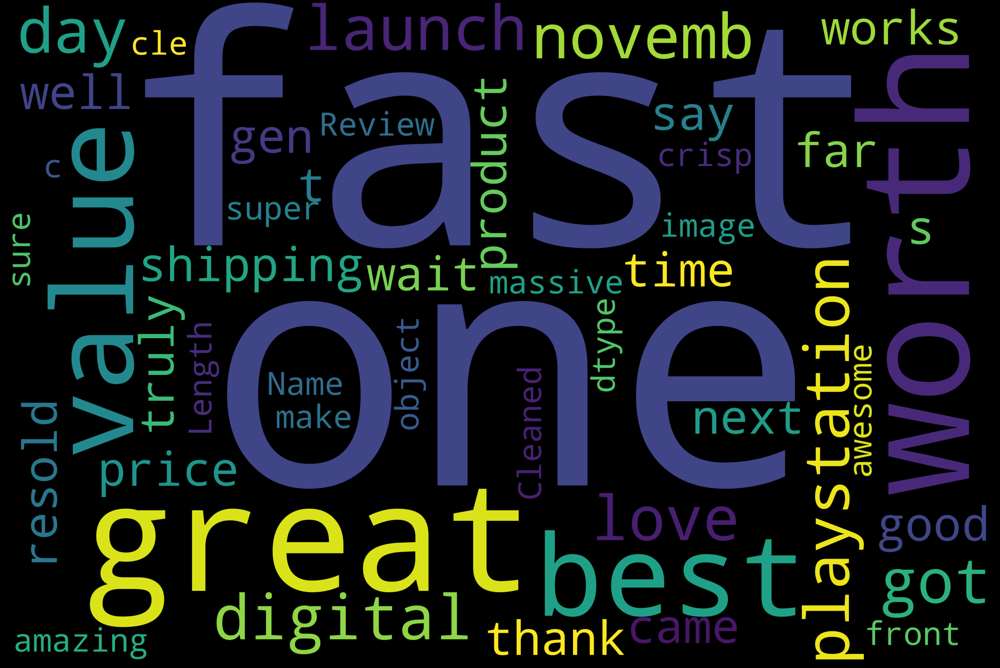

In [16]:
text = review_pos["Cleaned Review"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

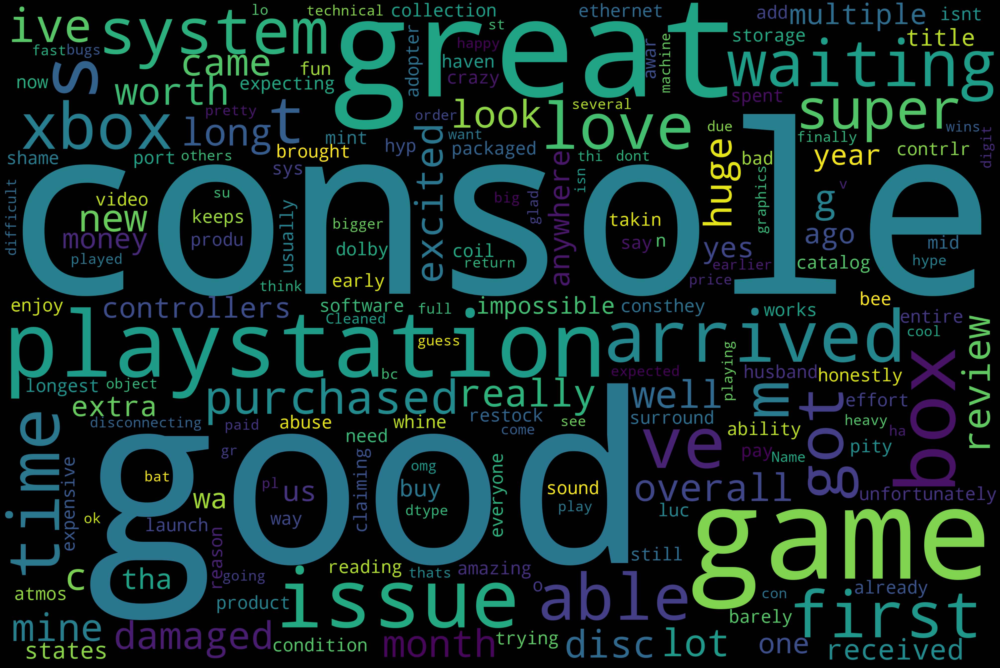

In [17]:
text = review_neu["Cleaned Review"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [18]:
stop_words= ['yourselves', 'between', 'whom', 'itself', 'is', "she's", 'up', 'herself', 'here', 'your', 'each', 
             'we', 'he', 'my', "you've", 'having', 'in', 'both', 'for', 'themselves', 'are', 'them', 'other',
             'and', 'an', 'during', 'their', 'can', 'yourself', 'she', 'until', 'so', 'these', 'ours', 'above', 
             'what', 'while', 'have', 're', 'more', 'only', "needn't", 'when', 'just', 'that', 'were', "don't", 
             'very', 'should', 'any', 'y', 'isn', 'who',  'a', 'they', 'to', 'too', "should've", 'has', 'before',
             'into', 'yours', "it's", 'do', 'against', 'on',  'now', 'her', 've', 'd', 'by', 'am', 'from', 
             'about', 'further', "that'll", "you'd", 'you', 'as', 'how', 'been', 'the', 'or', 'doing', 'such',
             'his', 'himself', 'ourselves',  'was', 'through', 'out', 'below', 'own', 'myself', 'theirs', 
             'me', 'why', 'once',  'him', 'than', 'be', 'most', "you'll", 'same', 'some', 'with', 'few', 'it',
             'at', 'after', 'its', 'which', 'there','our', 'this', 'hers', 'being', 'did', 'of', 'had', 'under',
             'over','again', 'where', 'those', 'then', "you're", 'i', 'because', 'does', 'all']

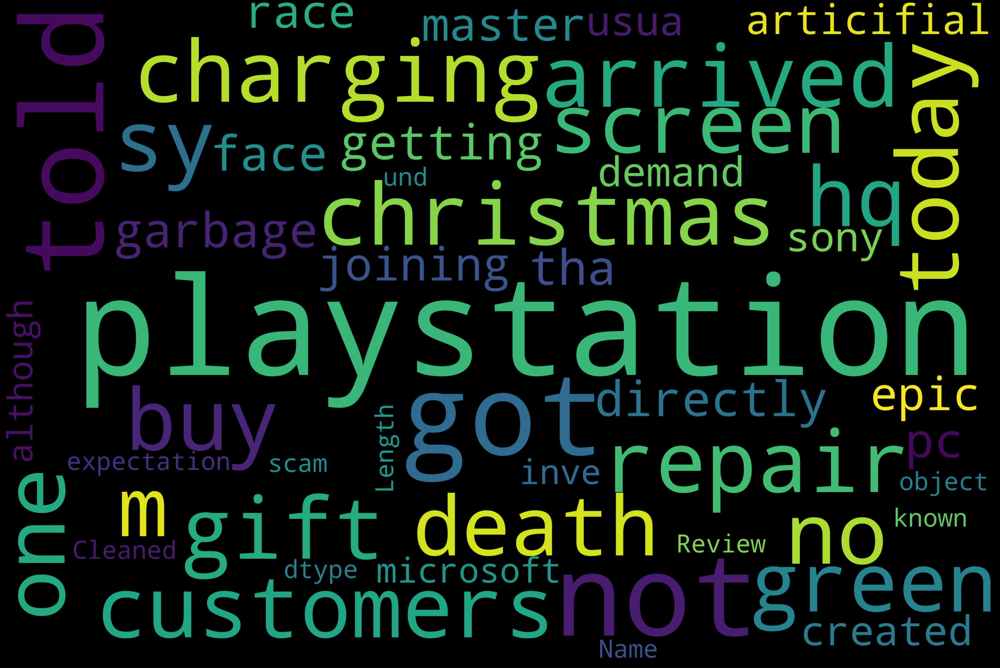

In [19]:
text = review_neg["Cleaned Review"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = stop_words).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

# XBOX

In [20]:
def data(file):
    df1 = pd.read_csv(file, index_col=0)
    df = df1
    df.dropna(inplace=True)
    df.reset_index(inplace=True)
    df.drop('index', axis=1, inplace=True)
    
    df['Cleaned Review'] = df['Review'].apply(review_cleaning)
    df['Sentiment'] = df.apply(f, axis=1)
    df['polarity'] = df['Cleaned Review'].map(lambda text: TextBlob(text).sentiment.polarity)
    df['review_len'] = df['Cleaned Review'].astype(str).apply(len)
    df['word_count'] = df['Cleaned Review'].apply(lambda x: len(str(x).split()))
    
    return df

In [21]:
file = 'xbox-reviews.csv'

In [22]:
df_x = data(file)
df_x

,User,Review Date,Ratings,Review,Cleaned Review,Sentiment,polarity,review_len,word_count
0,Khang Ngo,2022,5,This console is an absolute beast! I finally m...,this console is an absolute beast i finally ma...,Positive,0.196728,1650,308
1,SuperginraiX,2020,4,"So, yeah, new generation of hardware from Micr...",so yeah new generation of hardware from micros...,Positive,0.203475,5121,964
2,Ricardo Orrantia Ponce,2021,5,"I have been a gammer all my life, have owned a...",i have been a gammer all my life have owned al...,Positive,0.229692,3822,696
3,Anthony C. Franchino,2022,5,"When I purchased this, I was afraid of the int...",when i purchased this i was afraid of the inte...,Positive,0.070833,346,68
4,Jesse,2021,5,I started out on the OG Xbox when I was 5 year...,i started out on the og xbox when i was years...,Positive,0.118758,3813,749
...,...,...,...,...,...,...,...,...,...
2062,Amazon Customer,2021,5,Loved this Xbox everything was crazy fast and ...,loved this xbox everything was crazy fast and ...,Positive,0.225000,71,12
2063,Amazon Customer,2020,5,The delivery was pretty fast. The console was ...,the delivery was pretty fast the console was e...,Positive,0.245833,97,17
2064,ACS,2021,5,recommended.,recommended,Positive,0.000000,11,1
2065,Mark Hemz,2020,5,"Really good product, happy owner of the consol...",really good product happy owner of the console...,Positive,0.500000,89,16


In [23]:
df_x['review_len'].iplot(
    kind='hist',
    bins = 100,
    xTitle='review length',
    linecolor='black',
    yTitle='count',
    color='green',
    title='Review Text Length Distribution')

In [24]:
df_x['word_count'].iplot(
    kind='hist',
    bins=90,
    xTitle='word count',
    linecolor='black',
    yTitle='count',
    color = 'purple',
    title='Review Text Word Count Distribution')

In [25]:
#Filtering data
review_pos_x = df_x[df_x["Sentiment"]=='Positive'].dropna()
review_neu_x = df_x[df_x["Sentiment"]=='Neutral'].dropna()
review_neg_x = df_x[df_x["Sentiment"]=='Negative'].dropna()

## custom function for ngram generation ##
def generate_ngrams(text, n_gram=1):
    token = [token for token in text.lower().split(" ") if token != "" if token not in STOPWORDS]
    ngrams = zip(*[token[i:] for i in range(n_gram)])
    return [" ".join(ngram) for ngram in ngrams]

## custom function for horizontal bar chart ##
def horizontal_bar_chart(df_x, color):
    trace = go.Bar(
        y=df_x["word"].values[::-1],
        x=df_x["wordcount"].values[::-1],
        showlegend=False,
        orientation = 'h',
        marker=dict(
            color=color,
        ),
    )
    return trace

## Get the bar chart from positive Cleaned Reviews ##
freq_dict = defaultdict(int)
for sent in review_pos_x["Cleaned Review"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(25), 'orange')

## Get the bar chart from neutral Cleaned Reviews ##
freq_dict = defaultdict(int)
for sent in review_neu_x["Cleaned Review"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(25), 'grey')

## Get the bar chart from negative Cleaned Reviews ##
freq_dict = defaultdict(int)
for sent in review_neg_x["Cleaned Review"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace2 = horizontal_bar_chart(fd_sorted.head(25), 'purple')

# Creating two subplots
fig = tools.make_subplots(rows=3, cols=1, vertical_spacing=0.04,
                          subplot_titles=["Frequent positive words", "Frequent neutral words",
                                          "Frequent negative words"])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 2, 1)
fig.append_trace(trace2, 3, 1)
fig['layout'].update(height=1200, width=900, paper_bgcolor='rgb(233,233,233)', title="Monogram Word Plots")
iplot(fig, filename='word-plots')

C:\Users\hrith\anaconda3\lib\site-packages\plotly\tools.py:460: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



In [26]:
## Get the bar chart from positive Cleaned Review ##
freq_dict = defaultdict(int)
for sent in review_pos_x["Cleaned Review"]:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(25), 'orange')

## Get the bar chart from neutral Cleaned Review ##
freq_dict = defaultdict(int)
for sent in review_neu_x["Cleaned Review"]:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(25), 'grey')

## Get the bar chart from negative Cleaned Review ##
freq_dict = defaultdict(int)
for sent in review_neg_x["Cleaned Review"]:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace2 = horizontal_bar_chart(fd_sorted.head(25), 'purple')



# Creating two subplots
fig = tools.make_subplots(rows=3, cols=1, vertical_spacing=0.04,horizontal_spacing=0.25,
                          subplot_titles=["Frequent Positive Words", 
                                          "Frequent Neutral Words",
                                          "Frequent Negative Words"
                                          ])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 2, 1)
fig.append_trace(trace2, 3, 1)


fig['layout'].update(height=1000, width=800, paper_bgcolor='rgb(233,233,233)', title="Bigram Word Plots")
iplot(fig, filename='word-plots')

C:\Users\hrith\anaconda3\lib\site-packages\plotly\tools.py:460: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



In [27]:
## Get the bar chart from positive Cleaned Review ##
for sent in review_pos_x["Cleaned Review"]:
    for word in generate_ngrams(sent,3):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(25), 'orange')

## Get the bar chart from neutral Cleaned Review ##
freq_dict = defaultdict(int)
for sent in review_neu_x["Cleaned Review"]:
    for word in generate_ngrams(sent,3):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(25), 'grey')

## Get the bar chart from negative Cleaned Review ##
freq_dict = defaultdict(int)
for sent in review_neg_x["Cleaned Review"]:
    for word in generate_ngrams(sent,3):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace2 = horizontal_bar_chart(fd_sorted.head(25), 'purple')




# Creating two subplots
fig = tools.make_subplots(rows=3, cols=1, vertical_spacing=0.04, horizontal_spacing=0.05,
                          subplot_titles=["Frequent Positive Words", 
                                          "Frequent Neutral Words",
                                          "Frequent Negative Words"])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 2, 1)
fig.append_trace(trace2, 3, 1)
fig['layout'].update(height=1200, width=1200, paper_bgcolor='rgb(233,233,233)', title="Trigram Word Plots")
iplot(fig, filename='word-plots')

C:\Users\hrith\anaconda3\lib\site-packages\plotly\tools.py:460: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



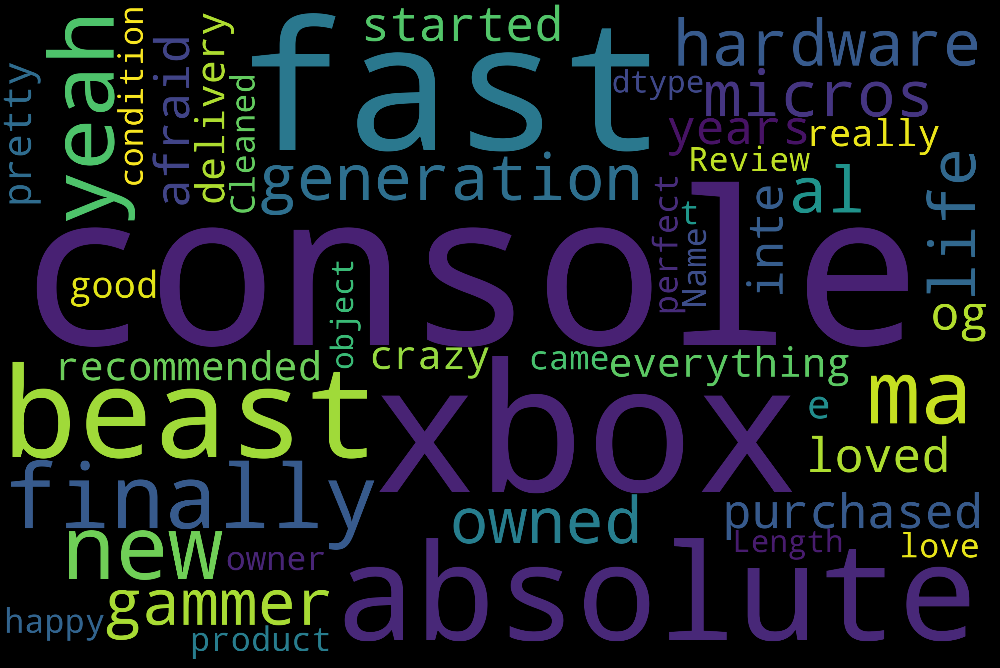

In [28]:
text = review_pos_x["Cleaned Review"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

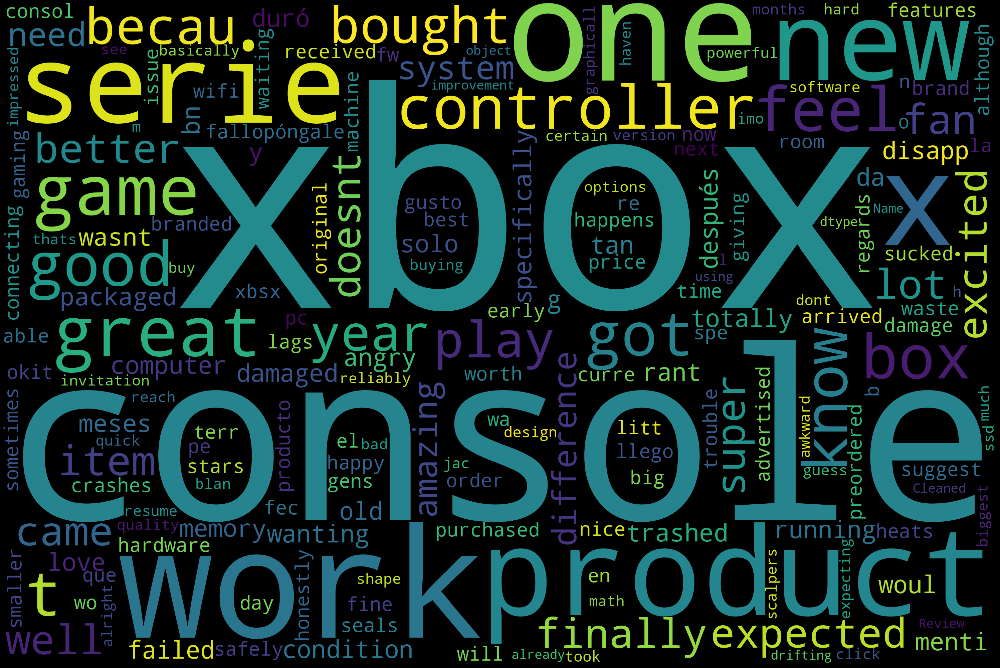

In [29]:
text = review_neu_x["Cleaned Review"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

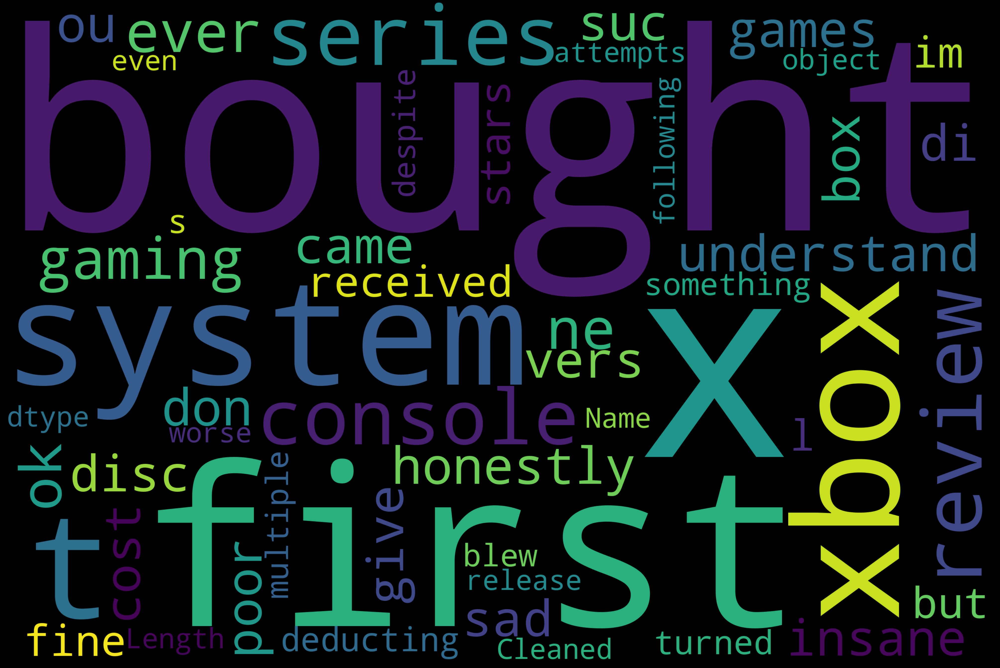

In [30]:
text = review_neg_x["Cleaned Review"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = stop_words).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

# comparison

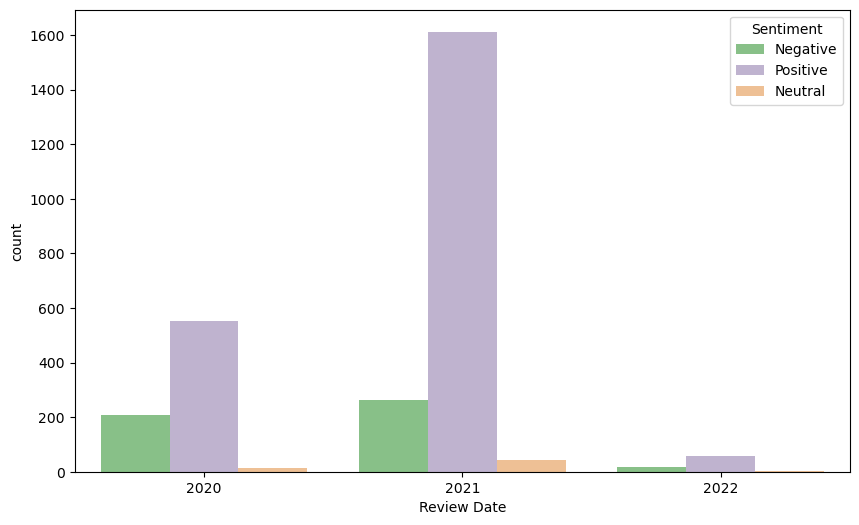

In [31]:
plt.figure(figsize=(10,6))
sns.countplot(data=df,x='Review Date',hue='Sentiment',palette='Accent');

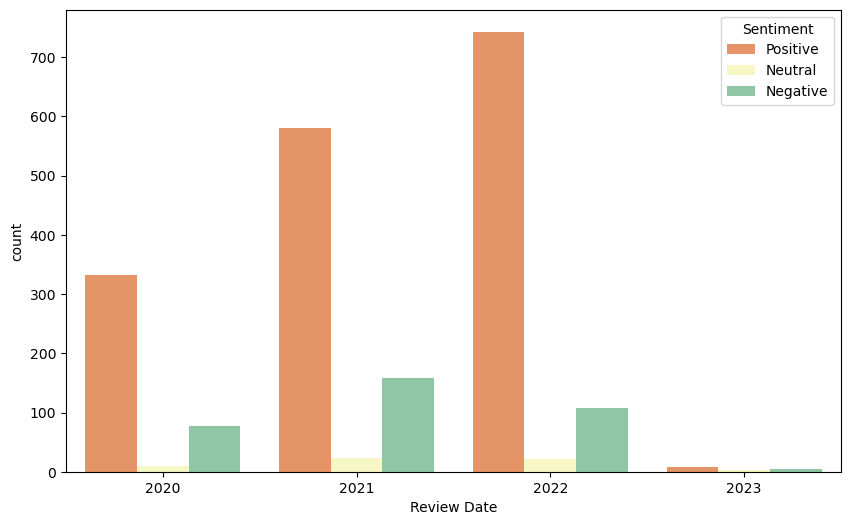

In [32]:
plt.figure(figsize=(10,6))
sns.countplot(data=df_x,x='Review Date',hue='Sentiment',palette='Spectral');

In [33]:
pd.DataFrame(df.groupby(['Review Date','Sentiment'])['Sentiment'].count())


Sentiment
Review Date Sentiment           
2020        Negative         209
            Neutral           12
            Positive         551
2021        Negative         264
            Neutral           42
            Positive        1612
2022        Negative          19
            Neutral            2
            Positive          58

In [34]:
pd.DataFrame(df_x.groupby(['Review Date','Sentiment'])['Sentiment'].count())

Sentiment
Review Date Sentiment           
2020        Negative          77
            Neutral           10
            Positive         332
2021        Negative         158
            Neutral           24
            Positive         580
2022        Negative         107
            Neutral           21
            Positive         743
2023        Negative           4
            Neutral            3
            Positive           8

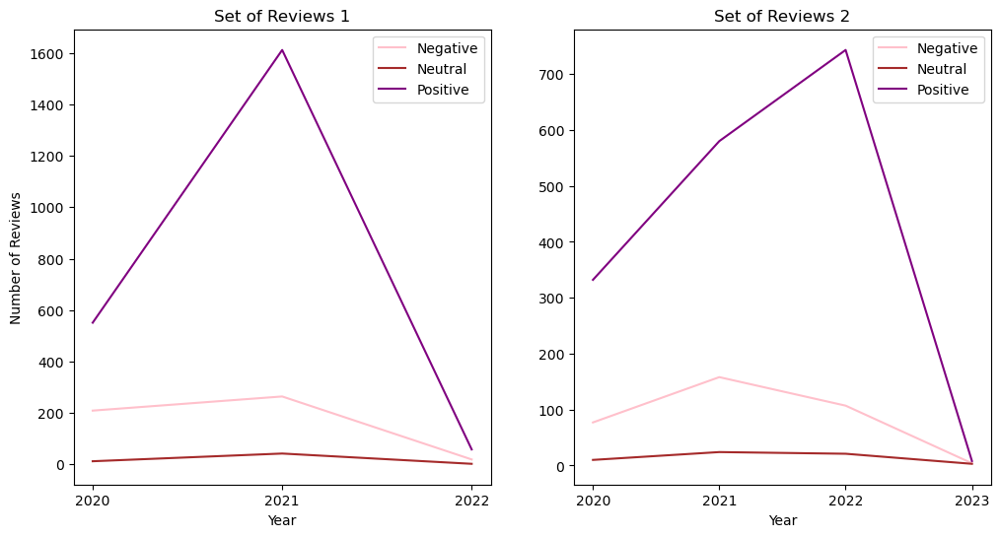

In [35]:
import matplotlib.pyplot as plt

# Sentiment data for first set of reviews
review_dates_1 = [2020, 2021, 2022]
negative_1 = [209, 264, 19]
neutral_1 = [12, 42, 2]
positive_1 = [551, 1612, 58]

# Sentiment data for second set of reviews
review_dates_2 = [2020, 2021, 2022, 2023]
negative_2 = [77, 158, 107, 4]
neutral_2 = [10, 24, 21, 3]
positive_2 = [332, 580, 743, 8]

# Set up the subplots
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,6))

# Plot the first set of reviews
ax[0].plot(review_dates_1, negative_1, color='pink', label='Negative')
ax[0].plot(review_dates_1, neutral_1, color='brown', label='Neutral')
ax[0].plot(review_dates_1, positive_1, color='purple', label='Positive')
# Set the tick locations and labels for the x-axis
ax[0].set_xticks(review_dates_1)
ax[0].set_xticklabels(review_dates_1)
ax[0].set_xlabel('Year')
ax[0].set_ylabel('Number of Reviews')
ax[0].legend()
ax[0].set_title('Set of Reviews 1')

# Plot the second set of reviews
ax[1].plot(review_dates_2, negative_2, color='pink', label='Negative')
ax[1].plot(review_dates_2, neutral_2, color='brown', label='Neutral')
ax[1].plot(review_dates_2, positive_2, color='purple', label='Positive')
ax[1].set_xlabel('Year')
ax[1].set_xticks(review_dates_2)
ax[1].set_xticklabels(review_dates_2)
#ax[1].set_ylabel('Number of Reviews')
ax[1].legend()
ax[1].set_title('Set of Reviews 2')

plt.show()

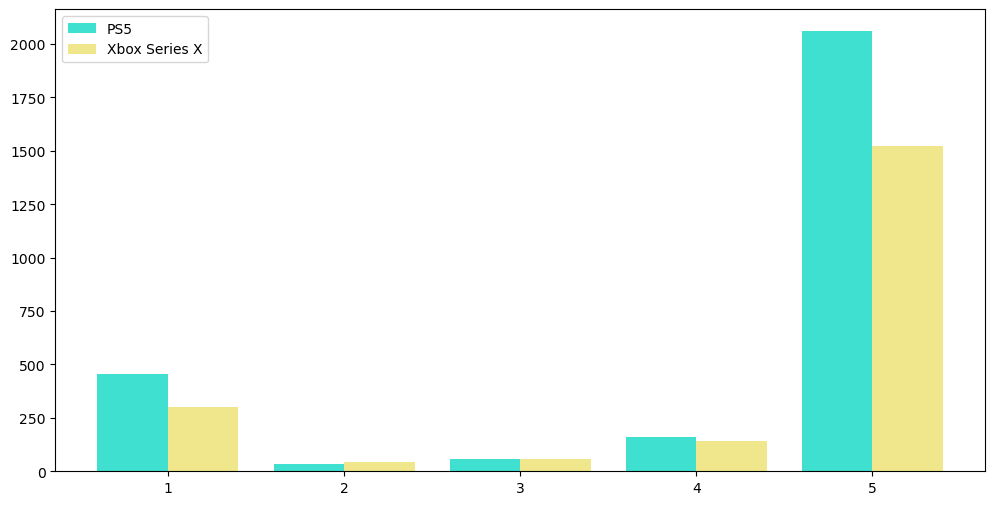

In [36]:
fig, ax = plt.subplots(figsize=(12,6))

# get the value counts for the Ratings column
value_counts1 = df['Ratings'].value_counts()
value_counts2 = df_x['Ratings'].value_counts()

# sort the values by index
value_counts1.sort_index(inplace=True)
value_counts2.sort_index(inplace=True)

# create the bar plot
bar_width = 0.4
ax.bar(value_counts1.index - bar_width/2, value_counts1.values, bar_width, color='turquoise', label='PS5')
ax.bar(value_counts2.index + bar_width/2, value_counts2.values, bar_width, color='khaki', label='Xbox Series X')

ax.legend()

# show the plot
plt.show()

In [37]:
df['polarity'].iplot(
    kind='hist',
    bins=50,
    xTitle='polarity',
    linecolor='black',
    yTitle='count',
    color='olive',
    title='Sentiment Polarity Distribution')

In [38]:
df_x['polarity'].iplot(
    kind='hist',
    bins=50,
    xTitle='polarity',
    linecolor='black',
    yTitle='count',
    color='slateblue',
    title='Sentiment Polarity Distribution')

# Model Ps5

In [39]:
from nltk.stem.porter import PorterStemmer
from sklearn.feature_extraction.text import TfidfVectorizer

# Machine Learning libraries
import sklearn 
from sklearn.svm import SVC
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import BernoulliNB 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn import svm, datasets
from sklearn import preprocessing 


#Metrics libraries
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc

In [40]:
df

,User,Review Date,Ratings,Review,Cleaned Review,Sentiment,polarity,review_len,word_count
0,AS,2022,1,This was a Christmas gift that arrived with a ...,this was a christmas gift that arrived with a ...,Negative,0.033333,113,22
1,Joe Bailey,2022,1,Playstation is charging customers to repair sy...,playstation is charging customers to repair sy...,Negative,0.000000,168,27
2,Rayson’s Distribution LLC,2022,5,The best value is the digital but this one is ...,the best value is the digital but this one is ...,Positive,0.440000,66,14
3,Viktor K.,2022,5,I got the PlayStation 5 on Launch Day in Novem...,i got the playstation on launch day in novemb...,Positive,0.098110,2323,404
4,Aleana Johnson,2022,2,I just got it in today and no one told me that...,i just got it in today and no one told me that...,Negative,-0.468750,108,24
...,...,...,...,...,...,...,...,...,...
2764,Noel Helms,2020,5,Next Gen is truly here. This is by far one of ...,next gen is truly here this is by far one of t...,Positive,0.525000,101,21
2765,Alex,2020,5,All i have to say is that it’s amazing 😆,all i have to say is that it’s amazing,Positive,0.600000,38,9
2766,Matthew J. Prevost,2020,1,What a scam!,what a scam,Negative,0.000000,11,3
2767,ZVB73,2020,5,"The PS5 is massive. Just up front, make sure t...",the is massive just up front make sure to cle...,Positive,0.158333,555,96


In [41]:
# calling the label encoder function
label_encoder = preprocessing.LabelEncoder() 
  
# Encode labels in column 'sentiment'. 
df['Sentiment']= label_encoder.fit_transform(df['Sentiment']) 
  
df['Sentiment'].unique() 

array([0, 2, 1])

In [42]:
df['Sentiment'].value_counts()

2    2221
0     492
1      56
Name: Sentiment, dtype: int64

In [43]:
#Extracting 'reviews' for processing
review_features=df.copy()
review_features=review_features[['Cleaned Review']].reset_index(drop=True)
review_features.head()

,Cleaned Review
0,this was a christmas gift that arrived with a ...
1,playstation is charging customers to repair sy...
2,the best value is the digital but this one is ...
3,i got the playstation on launch day in novemb...
4,i just got it in today and no one told me that...


In [44]:
#Performing stemming on the review dataframe
ps = PorterStemmer()

#splitting and adding the stemmed words except stopwords
corpus = []
for i in range(0, len(review_features)):
    review = re.sub('[^a-zA-Z]', ' ', review_features['Cleaned Review'][i])
    review = review.split()
    review = [ps.stem(word) for word in review if not word in stop_words]
    review = ' '.join(review)
    corpus.append(review)    

In [45]:
corpus[1]

'playstat charg custom repair system faulti factori issu didnt aris warranti expir power shut off game'

In [46]:
tfidf_vectorizer = TfidfVectorizer(max_features=5000,ngram_range=(2,2))
# TF-IDF feature matrix
X= tfidf_vectorizer.fit_transform(review_features['Cleaned Review'])

In [47]:
X.shape

(2769, 5000)

In [48]:
#Getting the target variable(encoded)
y=df['Sentiment']

In [49]:
from collections import Counter
from imblearn.over_sampling import SMOTE

In [50]:
print(f'Original dataset shape : {Counter(y)}')

smote = SMOTE(random_state=42)
X_res, y_res = smote.fit_resample(X, y)

print(f'Resampled dataset shape {Counter(y_res)}')

Original dataset shape : Counter({2: 2221, 0: 492, 1: 56})
Resampled dataset shape Counter({0: 2221, 2: 2221, 1: 2221})


In [51]:
## Divide the dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.25, random_state=0)

In [52]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    thresh = cm.max() / 2.
    for i in range (cm.shape[0]):
        for j in range (cm.shape[1]):
            plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [53]:
#Ignore warnings
import warnings
warnings.filterwarnings('ignore')

In [54]:
#creating the objects
logreg_cv = LogisticRegression(random_state=0)
dt_cv=DecisionTreeClassifier()
knn_cv=KNeighborsClassifier()
svc_cv=SVC()
nb_cv=BernoulliNB()
cv_dict = {0: 'Logistic Regression', 1: 'Decision Tree',2:'KNN',3:'SVC',4:'Naive Bayes'}
cv_models=[logreg_cv,dt_cv,knn_cv,svc_cv,nb_cv]


for i,model in enumerate(cv_models):
    print("{} Test Accuracy: {}".format(cv_dict[i],cross_val_score(model, X, y, cv=10, scoring ='accuracy').mean()))

Logistic Regression Test Accuracy: 0.8338722335583111
Decision Tree Test Accuracy: 0.7905286977449902
KNN Test Accuracy: 0.7468306911526186
SVC Test Accuracy: 0.8190720975252447
Naive Bayes Test Accuracy: 0.7970046565165071


In [55]:
import numpy as np

In [56]:
param_grid = {'C': np.logspace(-4, 4, 50),
             'penalty':['l1', 'l2']}
clf = GridSearchCV(LogisticRegression(random_state=0), param_grid,cv=5, verbose=0,n_jobs=-1)
best_model = clf.fit(X_train,y_train)
print(best_model.best_estimator_)
print("The mean accuracy of the model is:",best_model.score(X_test,y_test))

LogisticRegression(C=75.43120063354607, random_state=0)
The mean accuracy of the model is: 0.9243697478991597


In [59]:
logreg = LogisticRegression(C=10000.0, random_state=0)
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))

Accuracy of logistic regression classifier on test set: 0.93


Confusion matrix, without normalization


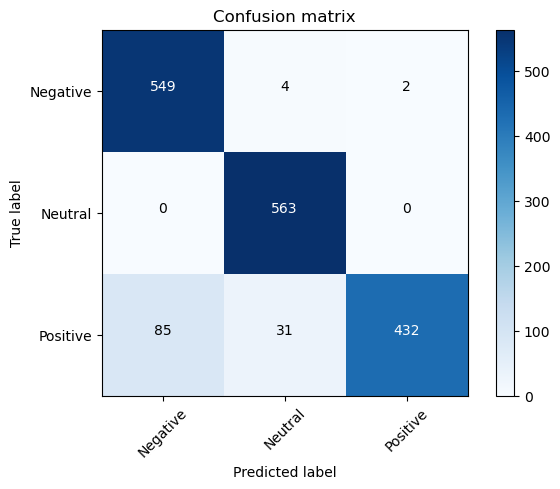

In [60]:
cm = metrics.confusion_matrix(y_test, y_pred)
plot_confusion_matrix(cm, classes=['Negative','Neutral','Positive'])

In [61]:
print("Classification Report:\n",classification_report(y_test, y_pred))

Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.99      0.92       555
           1       0.94      1.00      0.97       563
           2       1.00      0.79      0.88       548

    accuracy                           0.93      1666
   macro avg       0.93      0.93      0.92      1666
weighted avg       0.93      0.93      0.92      1666



In [86]:
df_x

,User,Review Date,Ratings,Review,Cleaned Review,Sentiment,polarity,review_len,word_count
0,Khang Ngo,2022,5,This console is an absolute beast! I finally m...,this console is an absolute beast i finally ma...,2,0.196728,1650,308
1,SuperginraiX,2020,4,"So, yeah, new generation of hardware from Micr...",so yeah new generation of hardware from micros...,2,0.203475,5121,964
2,Ricardo Orrantia Ponce,2021,5,"I have been a gammer all my life, have owned a...",i have been a gammer all my life have owned al...,2,0.229692,3822,696
3,Anthony C. Franchino,2022,5,"When I purchased this, I was afraid of the int...",when i purchased this i was afraid of the inte...,2,0.070833,346,68
4,Jesse,2021,5,I started out on the OG Xbox when I was 5 year...,i started out on the og xbox when i was years...,2,0.118758,3813,749
...,...,...,...,...,...,...,...,...,...
2062,Amazon Customer,2021,5,Loved this Xbox everything was crazy fast and ...,loved this xbox everything was crazy fast and ...,2,0.225000,71,12
2063,Amazon Customer,2020,5,The delivery was pretty fast. The console was ...,the delivery was pretty fast the console was e...,2,0.245833,97,17
2064,ACS,2021,5,recommended.,recommended,2,0.000000,11,1
2065,Mark Hemz,2020,5,"Really good product, happy owner of the consol...",really good product happy owner of the console...,2,0.500000,89,16


In [87]:
def func(df_x):
    # calling the label encoder function
    label_encoder = preprocessing.LabelEncoder() 
    # Encode labels in column 'sentiment'. 
    df_x['Sentiment']= label_encoder.fit_transform(df_x['Sentiment']) 
    
    review_features=df_x.copy()
    review_features=review_features[['Cleaned Review']].reset_index(drop=True)
    review_features.head()
    
    ps = PorterStemmer()

    #splitting and adding the stemmed words except stopwords
    corpus = []
    for i in range(0, len(review_features)):
        review = re.sub('[^a-zA-Z]', ' ', review_features['Cleaned Review'][i])
        review = review.split()
        review = [ps.stem(word) for word in review if not word in stop_words]
        review = ' '.join(review)
        corpus.append(review)  
        
    tfidf_x_vectorizer = TfidfVectorizer(max_features=5000,ngram_range=(2,2))
    # TF-Idf_x feature matrix
    X= tfidf_x_vectorizer.fit_transform(review_features['Cleaned Review'])
    
    y=df_x['Sentiment']
    print(f'Original dataset shape : {Counter(y)}')

    smote = SMOTE(random_state=42)
    X_res, y_res = smote.fit_resample(X, y)

    print(f'Resampled dataset shape {Counter(y_res)}')
    
    X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.25, random_state=0)
    
        #creating the objects
    logreg_cv = LogisticRegression(random_state=0)
    dt_cv=DecisionTreeClassifier()
    knn_cv=KNeighborsClassifier()
    svc_cv=SVC()
    nb_cv=BernoulliNB()
    cv_dict = {0: 'Logistic Regression', 1: 'Decision Tree',2:'KNN',3:'SVC',4:'Naive Bayes'}
    cv_models=[logreg_cv,dt_cv,knn_cv,svc_cv,nb_cv]


    for i,model in enumerate(cv_models):
        print("{} Test Accuracy: {}".format(cv_dict[i],cross_val_score(model, X, y, cv=10, scoring ='accuracy').mean()))
    
    param_grid = {'C': np.logspace(-4, 4, 50),
             'penalty':['l1', 'l2']}
    clf = GridSearchCV(LogisticRegression(random_state=0), param_grid,cv=5, verbose=0,n_jobs=-1)
    best_model = clf.fit(X_train,y_train)
    print(best_model.best_estimator_)
    print("The mean accuracy of the model is:",best_model.score(X_test,y_test))
    
    logreg = LogisticRegression(C=10000.0, random_state=0)
    logreg.fit(X_train, y_train)
    y_pred = logreg.predict(X_test)
    print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))
    
    cm = metrics.confusion_matrix(y_test, y_pred)
    plot_confusion_matrix(cm, classes=['Negative','Neutral','Positive'])
    
    print("Classification Report:\n",classification_report(y_test, y_pred))

Original dataset shape : Counter({2: 1663, 0: 346, 1: 58})
Resampled dataset shape Counter({2: 1663, 1: 1663, 0: 1663})
Logistic Regression Test Accuracy: 0.8205196754373623
Decision Tree Test Accuracy: 0.7745391867173208
KNN Test Accuracy: 0.6981098447539984
SVC Test Accuracy: 0.8118169879461565
Naive Bayes Test Accuracy: 0.77065569157169
LogisticRegression(C=75.43120063354607, random_state=0)
The mean accuracy of the model is: 0.9230769230769231
Accuracy of logistic regression classifier on test set: 0.92
Confusion matrix, without normalization
Classification Report:
               precision    recall  f1-score   support

           0       0.84      1.00      0.91       402
           1       0.95      0.98      0.97       444
           2       0.99      0.78      0.87       402

    accuracy                           0.92      1248
   macro avg       0.93      0.92      0.92      1248
weighted avg       0.93      0.92      0.92      1248



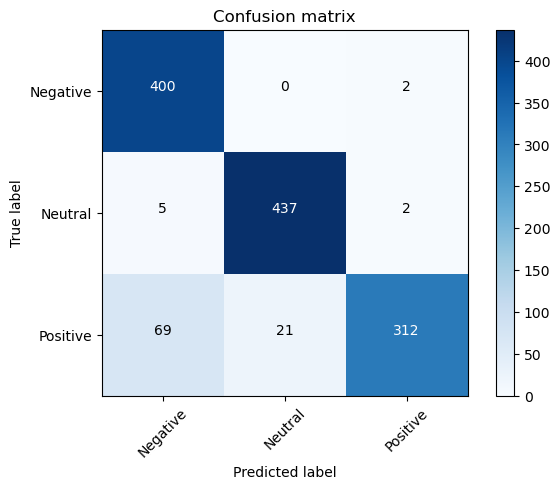

In [88]:
func(df_x)